In [ ]:
# !pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

In [ ]:
import os
import torch
import pandas as pd
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
from sklearn.model_selection import train_test_split

In [ ]:
# import os
# os.chdir("/content/drive/MyDrive/Documents/current_projects/Fraud Analytics/")
# NOTE::: Keep the file name as db.csv in the current working directory

## Outline
We implement a cost sensitive example dependent logistic regression algorithm. The model takes into account the real costs due to misclassification and correct classification.  
Rest of the notebook is sectioned as follows:  


1.   Objective
2.   Data Summary
3.   Implementation of Neural Nets
4.   Training and Experimentations Results



# Negative Log Likelihood Loss (NLLLoss)
We minimize the negative logarithm of likelihood:  
J(x) = -y log(f(x)) - (1-y) log(1-f(x))

---

## COST-SENSITIVE Loss
**NLLLoss** implicitly assumes that false positives and false negatives have the same costs, whereas this is not the case in several real-world applications.  

Here we minimize cost-sensitive logarithmic loss:  
J(x) = -y (log(f(x)) * C<sub>TP</sub> + log(1-f(x)) * C<sub>FN</sub>) - (1 - y) (log(f(x)) * C<sub>FP</sub> + log(1-f(x)) * C<sub>TN</sub>)

---

## Objective
We try to implement and compare the incurred loss and accuracy between neural nets and two other models, namely logistic regression and cost-sensitive logistic regression, and analyze the trade-off between accuracy and loss.

In [ ]:
# Reading the csv file
csv_file = "db.csv"
dataframe = pd.read_csv("db.csv")
X = dataframe.drop(labels = ['Status'], axis = 1)
y = dataframe['Status'].copy()

# Train test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.33, random_state=42)


In [ ]:
# Dataset summary
from pandas_profiling import ProfileReport
profile = ProfileReport(dataframe, title="Pandas Profiling Report", progress_bar=False)
profile.to_file("data_analysis.html")
profile


# Dataset Summary
Above profiling shows different correlations and data distribution in the dataset.
Few points to note:


*   Samples with label 0 (total 103554) is almost twice compared to label 1(total 44082).
*   There are no missing values in the whole dataset.
*   Many of the columns like PFD, PFG, SFD, SFG, WP, AH and AN have most of the values as 0. This might indicate that most samples which are labelled 0 have these common values.
*   There is a strong correlation between 'NotCount' & 'YesCount' and the label. This could lead to fairly good accuracy, if we use logistic regression but the real cost can be very high even with good classification score.



In [ ]:
class LoanDataset(Dataset):
    """Fraud Detection Dataset"""
    
    def __init__(self, dataframe, label):
        """
        Args:
            dataframe (pd.DataFrame): Input features.
            label (pd.DataFrame): Labels
        """
        
        self.X = torch.tensor(dataframe.drop(['FNC'], axis = 1).values)
        self.y = torch.tensor(label.values)
        self.C_FN = torch.tensor(dataframe['FNC'].values)


    def __len__(self):
        return len(self.y)

    def __getitem__(self, idx):
        """
        Args:
            id (int): Index of the element

        Returns:
            tuple: (features, label, C_TP, C_TN, C_FP, C_FN)
        """
        sample = (self.X[idx], self.y[idx], 100.0, 0.0, 100.0, self.C_FN[idx])
        return sample

In [ ]:
class LogisticRegression(torch.nn.Module):
    """Logistic regression model"""
    def __init__(self, input_dim, output_dim):
        """
        Args:
            input_dim (int): No. of features 
            output_dim (int): No. of classes
        """
        super(LogisticRegression, self).__init__()
        self.linear = torch.nn.Linear(input_dim, output_dim)
        self.softmax = torch.nn.LogSoftmax(dim = 1)

    def forward(self, x):
        """Feed forward"""
        outputs = self.linear(x)
        outputs = self.softmax(outputs)
        return outputs

In [ ]:
class NeuralNet(torch.nn.Module):
    """Neural Network Model"""
    def __init__(self, input_dim, output_dim):
        """
        Args:
            input_dim (int): No. of features 
            output_dim (int): No. of classes
        """
        super(NeuralNet, self).__init__()
        self.fc1 = torch.nn.Linear(input_dim, 2*input_dim)
        self.fc2 = torch.nn.Linear(2*input_dim, output_dim)
        self.softmax = torch.nn.LogSoftmax(dim = 1)

    def forward(self, x):
        """Feed forward"""
        x = F.relu(self.fc1(x))
        x = self.softmax(self.fc2(x))
        return x

In [ ]:
def variantCostInsensitive(f, y, C_TP, C_TN, C_FP, C_FN):
    """Cost Insensitive Loss function
    Args:
        f (torch.tensor): A torch.tensor of shape (Nx2) for predicted probabilities (predictions should be log probabilities, e.g. LogSoftmax)..
        y (torch.tensor): A torch.tensor of shape (Nx2) for actual probabilities.
        C_TP (torch.tensor): A torch.tensor of shape (Nx1) for true positive costs.
        C_TN (torch.tensor): A torch.tensor of shape (Nx1) for true negative costs.
        C_FP (torch.tensor): A torch.tensor of shape (Nx1) for false positive costs.
        C_FN (torch.tensor): A torch.tensor of shape (Nx1) for false negative costs.
    """
    y = y.float()
    return (
        -torch.dot(y, f[:, 1]) 
        - torch.dot(1-y, f[:, 0])
        )/len(y)
    
def variantA(f, y, C_TP, C_TN, C_FP, C_FN):
    """Cost Insensitive Loss function
    Args:
        f (torch.tensor): A torch.tensor of shape (Nx2) for predicted probabilities (predictions should be log probabilities, e.g. LogSoftmax).
        y (torch.tensor): A torch.tensor of shape (Nx2) for actual probabilities.
        C_TP (torch.tensor): A torch.tensor of shape (Nx1) for true positive costs.
        C_TN (torch.tensor): A torch.tensor of shape (Nx1) for true negative costs.
        C_FP (torch.tensor): A torch.tensor of shape (Nx1) for false positive costs.
        C_FN (torch.tensor): A torch.tensor of shape (Nx1) for false negative costs.
    """
    y = y.float()
    C_FN = C_FN.float()
    C_FP = C_FP.float()
    C_TN = C_TN.float()
    C_TP = C_TP.float()
    return (
        -torch.dot(y * C_TP , f[:, 1]) # True Positive 
        -torch.dot(y * C_FN , f[:, 0]) # False Negative
        - torch.dot((1 - y) * C_TN, f[:, 0]) # True Negative
        - torch.dot((1 - y) * C_FP, f[:, 1]) # False Positive
        )/len(y)

In [ ]:
def getModelAcc(model, test_loader): 
    """Utility function to return model accuracy"""  
    correct = 0
    total_samples = 0
    for batch in test_loader:
        feats = batch[0]
        labels = batch[1]
        out = model(feats.float())
        _, predicted = torch.max(out.data, 1)
        total_samples += labels.size(0)
        correct += (predicted == labels).sum()
    return 100 * correct / total_samples

def getModelLoss(model, test_loader, criterion):
    """Utility function to get model loss based on criterion"""
    total_samples = 0
    total_loss = 0
    for batch in test_loader:
        feats = batch[0]
        labels = batch[1]
        costs = batch[2:]
        out = model(feats.float())
        loss = criterion(out, labels, *costs)
        total_loss += loss
        total_samples += len(labels)
    return (total_loss/total_samples)

In [ ]:
def train(model, optimizer, criterion, 
          train_loader, test_loader, 
          num_epochs):
    """Train the model"""
    losses = []
    testLRLosses = [] 
    testCSLRLosses = []
    testAccs = []
    iter = 0
    for epoch in range(num_epochs):
        for batch in train_loader:
            feats = batch[0]
            labels = batch[1]
            costs = batch[2:]
            
            # Clear gradients w.r.t. parameters
            optimizer.zero_grad()

            outputs = model(feats.float())
            loss = criterion(outputs, labels, *costs)
            loss.backward()
            optimizer.step()

            if iter % 500 == 0:
                testLRLoss = getModelLoss(model, test_loader, variantCostInsensitive)
                testCSLRLoss = getModelLoss(model, test_loader, variantA)
                testAcc = getModelAcc(model, test_loader)
                
                losses.append(loss)
                testLRLosses.append(testLRLoss)
                testCSLRLosses.append(testCSLRLoss)
                testAccs.append(testAcc)
                print("""Iter: {}, TrainingLoss: {},
                    TestLRModelLoss: {}, TestCSLRModelLoss: {}, 
                    TestAccuracy: {}""".format(
                        iter, loss.item()/len(labels), 
                        testLRLoss,
                        testCSLRLoss,
                        testAcc, 
                    ))
            iter += 1
    return losses, testLRLosses, testCSLRLosses, testAccs

# Training Cost sensitive Neural Networks

In [ ]:
# Cost sensitive neural network
train_dataset = LoanDataset(X_train, y_train)
test_dataset = LoanDataset(X_test, y_test)

batch_size = 100
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

print("Train Samples Count:", len(train_dataset))
print("Test Samples Count:", len(test_dataset))

# Choosing model and training elements
input_dim = train_dataset[0][0].shape[0]
output_dim = 2
csnn_model = NeuralNet(input_dim, output_dim)

learning_rate = 0.002
optimizer = torch.optim.Adam(csnn_model.parameters(), lr=learning_rate)
# optimizer = torch.optim.SGD(csnn_model.parameters(), lr=learning_rate)

criterion = variantA # Using example dependent cost function

n_iters = 10000
num_epochs = n_iters / (len(train_dataset) / batch_size)
num_epochs = int(num_epochs)
nn_losses, nn_testLRLosses, nn_testCSLRLosses, nn_testAccs = \
    train(csnn_model, optimizer, criterion, train_loader, test_loader, num_epochs)

Train Samples Count: 98916
Test Samples Count: 48720
Iter: 0, TrainingLoss: 1.4412039184570313,
                    TestLRModelLoss: 0.007566864602267742, TestCSLRModelLoss: 1.9068361520767212, 
                    TestAccuracy: 60.539817810058594
Iter: 500, TrainingLoss: 0.6938960266113281,
                    TestLRModelLoss: 0.021573888137936592, TestCSLRModelLoss: 0.6423445343971252, 
                    TestAccuracy: 26.808292388916016
Iter: 1000, TrainingLoss: 0.6700323486328125,
                    TestLRModelLoss: 0.020952051505446434, TestCSLRModelLoss: 0.6077874302864075, 
                    TestAccuracy: 27.88793182373047
Iter: 1500, TrainingLoss: 0.7289115905761718,
                    TestLRModelLoss: 0.025863010436296463, TestCSLRModelLoss: 0.5777605772018433, 
                    TestAccuracy: 27.914613723754883
Iter: 2000, TrainingLoss: 0.3246866226196289,
                    TestLRModelLoss: 0.022424008697271347, TestCSLRModelLoss: 0.5687048435211182, 
               

# Experimentation
We train two other models, namely logistic regression and cost sensitive logistic regression, and compare their performance with neural networks implementation.

# Training Vanilla logistic regression

In [ ]:
# Cost insensitive logistic regression
train_dataset = LoanDataset(X_train, y_train)
test_dataset = LoanDataset(X_test, y_test)

batch_size = 100
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

print("Train Samples Count:", len(train_dataset))
print("Test Samples Count:", len(test_dataset))

# Choosing model and training elements
input_dim = train_dataset[0][0].shape[0]
output_dim = 2
lr_model = LogisticRegression(input_dim, output_dim)
learning_rate = 0.002
optimizer = torch.optim.SGD(lr_model.parameters(), lr=learning_rate)

criterion = variantCostInsensitive # Using negative log likelihood loss


n_iters = 10000
num_epochs = n_iters / (len(train_dataset) / batch_size)
num_epochs = int(num_epochs)
lr_losses, lr_testLRLosses, lr_testCSLRLosses, lr_testAccs = \
    train(lr_model, optimizer, criterion, train_loader, test_loader, num_epochs)

Train Samples Count: 98916
Test Samples Count: 48720
Iter: 0, TrainingLoss: 0.01736878514289856,
                    TestLRModelLoss: 0.01873948983848095, TestCSLRModelLoss: 2.905076265335083, 
                    TestAccuracy: 70.13136291503906
Iter: 500, TrainingLoss: 0.0025638234615325928,
                    TestLRModelLoss: 0.003111185971647501, TestCSLRModelLoss: 5.224447250366211, 
                    TestAccuracy: 86.51477813720703
Iter: 1000, TrainingLoss: 0.001975377798080444,
                    TestLRModelLoss: 0.0031073151621967554, TestCSLRModelLoss: 5.162418842315674, 
                    TestAccuracy: 86.51272583007812
Iter: 1500, TrainingLoss: 0.0025201350450515746,
                    TestLRModelLoss: 0.003106827847659588, TestCSLRModelLoss: 5.289737224578857, 
                    TestAccuracy: 86.47372436523438
Iter: 2000, TrainingLoss: 0.003016368746757507,
                    TestLRModelLoss: 0.003099785652011633, TestCSLRModelLoss: 4.999478340148926, 
            

# Training Cost sensitive example dependent logistic regression

In [ ]:
# Cost sensitive logistic regression
train_dataset = LoanDataset(X_train, y_train)
test_dataset = LoanDataset(X_test, y_test)

batch_size = 100
train_loader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(dataset=test_dataset, batch_size=batch_size, shuffle=False)

print("Train Samples Count:", len(train_dataset))
print("Test Samples Count:", len(test_dataset))

# Choosing model and training elements
input_dim = train_dataset[0][0].shape[0]
output_dim = 2
cslr_model = LogisticRegression(input_dim, output_dim)
learning_rate = 0.001
optimizer = torch.optim.Adam(cslr_model.parameters(), lr=learning_rate)
# optimizer = torch.optim.SGD(cslr_model.parameters(), lr=learning_rate)

criterion = variantA # Using example dependent cost function

n_iters = 10000
num_epochs = n_iters / (len(train_dataset) / batch_size)
num_epochs = int(num_epochs)
cslr_losses, cslr_testLRLosses, cslr_testCSLRLosses, cslr_testAccs = \
    train(cslr_model, optimizer, criterion, train_loader, test_loader, num_epochs)

Train Samples Count: 98916
Test Samples Count: 48720
Iter: 0, TrainingLoss: 1.551929931640625,
                    TestLRModelLoss: 0.006520978640764952, TestCSLRModelLoss: 2.080678701400757, 
                    TestAccuracy: 70.0574722290039
Iter: 500, TrainingLoss: 0.8921473693847656,
                    TestLRModelLoss: 0.014421775937080383, TestCSLRModelLoss: 1.001996397972107, 
                    TestAccuracy: 14.24466323852539
Iter: 1000, TrainingLoss: 0.7225180816650391,
                    TestLRModelLoss: 0.016679255291819572, TestCSLRModelLoss: 0.9051231145858765, 
                    TestAccuracy: 14.542282104492188
Iter: 1500, TrainingLoss: 0.5343832015991211,
                    TestLRModelLoss: 0.017112474888563156, TestCSLRModelLoss: 0.8447825908660889, 
                    TestAccuracy: 15.418719291687012
Iter: 2000, TrainingLoss: 1.1684471893310546,
                    TestLRModelLoss: 0.014452929608523846, TestCSLRModelLoss: 0.823244035243988, 
                    T

In [ ]:
x = list(range(0, 10000, 500))

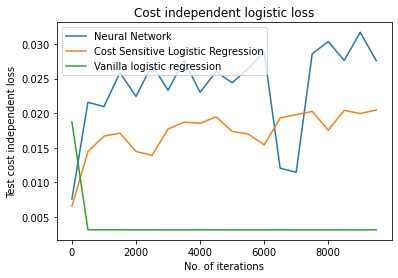

In [ ]:
plt.plot(x, nn_testLRLosses, label='Cost Sensitive Neural Network')
plt.plot(x, cslr_testLRLosses, label='Cost Sensitive Logistic Regression')
plt.plot(x, lr_testLRLosses, label = 'Vanilla logistic regression')
plt.xlabel('No. of iterations')
plt.ylabel('Test cost independent loss')
plt.title('Cost independent logistic loss')
plt.legend()
plt.show()

# Comparison based on **negative log likelihood** loss function
Above plot shows that vanilla logistic regression performs best on test-dataset.  
It is expected because the vanilla logistic regression is trained to minimize the **negative log likelihood**, while the other model tries to minimize **cost sensitive example dependent loss function**.  
Later we see that even though vanilla logistic regression performs better here, it performs worse by **factor of ~10** when comparing based on real-life loss.

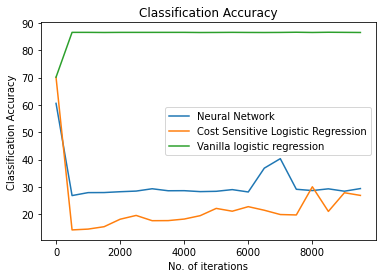

In [ ]:
plt.plot(x, nn_testAccs, label='Cost Sensitive Neural Network')
plt.plot(x, cslr_testAccs, label='Cost Sensitive Logistic Regression')
plt.plot(x, lr_testAccs, label = 'Vanilla logistic regression')
plt.xlabel('No. of iterations')
plt.ylabel('Classification Accuracy')
plt.title('Classification Accuracy')
plt.legend()
plt.show()

# Comparison based on **Classification Accuracy** function
Above plot shows that **CSED Neural Nets and logistic regression** performs bad when compared through accuracy, than **logistic regression**. But later plots reveals that even with better classification accuracy, **Logistic Regression** can cause huge real-world loss because of costly **false negatives** and **false positives**.

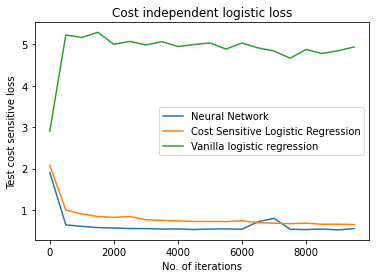

In [ ]:
plt.plot(x, nn_testCSLRLosses, label='Cost Sensitive Neural Network')
plt.plot(x, cslr_testCSLRLosses, label='Cost Sensitive Logistic Regression')
plt.plot(x, lr_testCSLRLosses, label = 'Vanilla logistic regression')
plt.xlabel('No. of iterations')
plt.ylabel('Test cost sensitive loss')
plt.title('Cost independent logistic loss')
plt.legend()
plt.show()

# Comparison based on **Coss sensitive example dependent** loss function
Above plot shows that **CSED Neural Nets and logistic regression** out-performs **logistic regression** by a huge factor **(around 10 times)**.  
This shows that even with less accuracy, **CSED models** are able to perform better, when it comes to real-life cost sensitive classfication where cost associated with **miss-classification (false negative)** is much more than cost associated with **false positives**.  
Hence, **CSED NN** consistently performs better that the others and is the model of choice in such scenarios.